In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

review_df = pd.read_csv('/Users/suneetabraham/Downloads/reviews.csv')
df = pd.read_csv('/Users/suneetabraham/Downloads/listings.csv')

In [3]:
review_df.columns

Index(['listing_id', 'id', 'date', 'reviewer_id', 'reviewer_name', 'comments'], dtype='object')

In [4]:
data_set_review = review_df.loc[:,['listing_id','reviewer_id','reviewer_name','comments']]
data_set_review.columns = ['id','reviewer_id','reviewer_name','comments']
data_set = df.loc[:,['id','name','review_scores_rating','amenities']]
data_set.columns = ['id','name','Score','amenities']

In [5]:
df=data_set.join(data_set_review.set_index('id'), on='id')
df['comments']= df['comments'].astype(str)

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px


In [7]:
# Product Scores
fig = px.histogram(df, x="Score")
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Score')
fig.show()

In [8]:
df.describe()

,id,Score,reviewer_id
count,3.754570e+05,374587.000000,3.745870e+05
mean,1.768184e+16,4.847267,1.178002e+08
std,1.022536e+17,0.147631,1.173324e+08
min,6.606000e+03,0.000000,1.500000e+01
25%,8.194782e+06,4.790000,2.591836e+07
50%,1.885894e+07,4.890000,7.582525e+07
75%,3.428366e+07,4.950000,1.756666e+08
max,7.174934e+17,5.000000,4.794285e+08


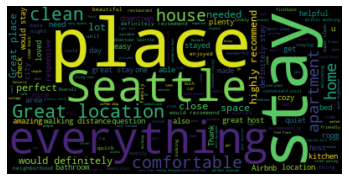

In [9]:
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud

#Creating Stopwords list

stopwords = set(stopwords.words('english'))
stopwords.update(["br","href"])
textt = " ".join(review for review in df.comments)
wordcloud = WordCloud(stopwords=stopwords).generate(textt)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [11]:
df = df[df['Score'] != 4.790000]
df['sentiment'] = df['Score'].apply(lambda rating : +1 if rating >4.790000 else -1)

/var/folders/fs/7nkpk4fn2vdf9kjv0msv7xtm0000gn/T/ipykernel_11167/461703256.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [10]:
df.score.describe()

AttributeError: 'DataFrame' object has no attribute 'score'

In [12]:
# split df - positive and negative sentiment:
positive = df[df['sentiment'] == 1]
negative = df[df['sentiment'] == -1]

In [13]:
positive = positive.dropna()
negative = negative.dropna()

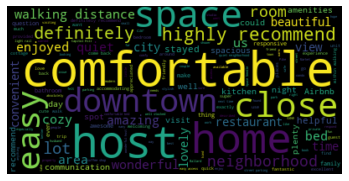

<Figure size 720x720 with 0 Axes>

In [20]:
import nltk
from nltk.corpus import stopwords

stopwords = set(stopwords.words('english'))
stopwords.update(['u','able','check',',describe','thanks',"seattle", "stay","place","also", "get", "needed", "perfect","exact","flavor","amazing"
                 'beautiful','br','thank','thankful','really','everything','nice'
                  ,'staying','made','would','house','apartment','clean','location','need','overall','highly recommend','one','great','nice','loved','good']) 
## good and great removed because they were included in negative sentiment
pos = " ".join(review for review in positive.comments)
wordcloud = WordCloud(stopwords=stopwords).generate(pos)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.figure(figsize=(10,10))
plt.show()

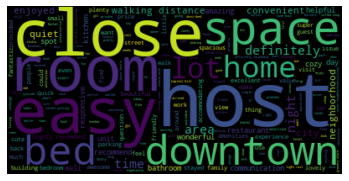

In [19]:
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud
stopwords = set(stopwords.words('english'))
stopwords.update(['u','able','check','comfortable','describe','thanks',"seattle", "stay","place","also", "get", "needed", "perfect","exact","flavor","amazing"
                 'beautiful','extremely','thank','like','thankful','really','everything','nice'
                  ,'staying','br','airbnb','made','would','us','house','apartment','clean','location','need','overall','highly recommend','one','great','nice','loved','good']) 

negreviews = " ".join(review for review in negative.comments)
wordcloud = WordCloud(stopwords=stopwords).generate(negreviews)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [242]:
df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})
fig = px.histogram(df, x="sentimentt")
fig.update_traces(marker_color="indianred",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5)
fig.update_layout(title_text='Product Sentiment')
fig.show()

In [16]:
def remove_punctuation(text):
    final = "".join(u for u in text if u not in ("?", ".", ";", ":",  "!",'"'))
    return final
df['Text'] = df['comments'].apply(remove_punctuation)
df = df.dropna(subset=['comments'])
df['comments'] = df['comments'].apply(remove_punctuation)

/var/folders/fs/7nkpk4fn2vdf9kjv0msv7xtm0000gn/T/ipykernel_11167/68007169.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [17]:
dfNew = df[['comments','sentiment']]
dfNew

,comments,sentiment
0,For the price its a great find if you just nee...,-1
0,When you rent a cheap place you can’t expect t...,-1
0,the host was awesome and flexible the place wa...,-1
0,Worth it,-1
0,Great value for the money The commute is perfe...,-1
...,...,...
5903,This is a beautiful location It's a 20ish minu...,1
5903,"Lovely spot overlooking the lake in a nice, qu...",1
5903,It was a nice place with everything we needed ...,1
5903,Sonal was very communicative and response Plac...,1


In [21]:
index = df.index
df['random_number'] = np.random.randn(len(index))
train = df[df['random_number'] <= 0.8]
test = df[df['random_number'] > 0.8]

In [22]:
# count vectorizer:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
train_matrix = vectorizer.fit_transform(train['comments'])
test_matrix = vectorizer.transform(test['comments'])

In [23]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(solver='lbfgs', max_iter=6000)

In [24]:
X_train = train_matrix
X_test = test_matrix
y_train = train['sentiment']
y_test = test['sentiment']

In [25]:

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler(with_mean=False)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [26]:
lr.fit(X_train,y_train)

LogisticRegression(max_iter=6000)

In [27]:
predictions = lr.predict(X_test)
print(predictions)

[-1  1  1 ... -1  1  1]


In [28]:
from sklearn.metrics import confusion_matrix,classification_report
new = np.asarray(y_test)
confusion_matrix(predictions,y_test)

array([[ 6585,  3961],
       [12150, 55495]])

In [29]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

          -1       0.35      0.62      0.45     10546
           1       0.93      0.82      0.87     67645

    accuracy                           0.79     78191
   macro avg       0.64      0.72      0.66     78191
weighted avg       0.85      0.79      0.82     78191

